In [1]:
import copy
import torch
import torch.nn as nn
from torch import Tensor
import torch.nn.functional as F
from typing import Optional, Any, Union, Callable

import winsound
duration = 1000  # milliseconds
freq = 440  # Hz

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [2]:
import math

class SoftmaxAttention_RBF(nn.Module):
    def __init__(self, d_model, nhead, dropout, norm=False):
        super().__init__()
        self.drop_attn = torch.nn.Dropout(p = dropout)
        self.head_dim = d_model//nhead
        self.norm = norm

    def forward(self, Q, K, V, attn_mask=None, key_padding_mask=None):
        # input [batch_size, nb_heads, seq_len, dim_head]
        
        b,h,n,p = K.shape
        
        # if self.norm:
        #     data_normalizer = (4/(p+2))**(1/(p+4))/(math.sqrt(2)*n**(1/(p+4)))
        # else:
        data_normalizer = (p ** -0.25)
        Q = Q * data_normalizer
        K = K * data_normalizer
        # v = v * mask[:, None, :, None]
        
        diag_Q = (Q * Q).sum(-1) * 0.5
        diag_Q = diag_Q.unsqueeze(dim=-1)
        diag_K = (K * K).sum(-1) * 0.5
        diag_K = diag_K.unsqueeze(dim=-2)


        product = (torch.einsum('...np,...mp->...nm', Q, K) - diag_Q 
            - diag_K)
        # - 1e9 * (1 - mask[:, None, None, :])
        attn = torch.exp(product)
        attn = attn/attn.sum(-1).unsqueeze(-1)
        attn = self.drop_attn(attn)

        X = torch.matmul(attn, V)

        # output [batch_size, nb_heads, seq_len, dim_head]
        return X

class SoftmaxAttention(nn.Module):
    def __init__(self, d_model, nhead, dropout):
        super().__init__()
        self.drop_attn = torch.nn.Dropout(p = dropout)
        self.head_dim = d_model//nhead

    def forward(self, Q, K, V, attn_mask=None, key_padding_mask=None):
        # input [batch_size, nb_heads, seq_len, dim_head]
        # print('Q', Q.abs().median()) # check scale
        # print('K', K.abs().median())
        dot = torch.matmul(Q, torch.transpose(K, -2, -1))
        dot = dot / math.sqrt(self.head_dim)

        attn = nn.functional.softmax(dot, dim = -1)
        attn = self.drop_attn(attn)

        X = torch.matmul(attn, V)

        # output [batch_size, nb_heads, seq_len, dim_head]
        return X


class Attention(nn.Module):
    def __init__(self, d_model, nhead, dropout, kdim, vdim, kernel = True, norm = False):
        super().__init__()


        self.dimq = d_model # input_dim
        self.dimk = kdim
        self.dimv = vdim
        self.head_dim = d_model//nhead
        self.num_head = nhead

        self.W_q = nn.Linear(self.dimq, self.num_head * self.head_dim)
        self.W_k = nn.Linear(self.dimk, self.num_head * self.head_dim)
        self.W_v = nn.Linear(self.dimv, self.num_head * self.head_dim)

        if kernel:
            self.attn = SoftmaxAttention_RBF(d_model, nhead, dropout, norm)
        else:
            self.attn = SoftmaxAttention(d_model, nhead, dropout)

        # self.ff = nn.Linear(self.num_head * self.head_dim, self.dim)

    def forward(self, q, k, v,
                        attn_mask=None,
                        key_padding_mask=None):


        Q = self.split_heads(self.W_q(q))
        K = self.split_heads(self.W_k(k))
        V = self.split_heads(self.W_v(v))
        with torch.cuda.amp.autocast(enabled = False):
                attn_out = self.attn(Q.float(), K.float(), V.float(), attn_mask=None, key_padding_mask=None)
        attn_out = self.combine_heads(attn_out)
        #out = self.ff(attn_out)

        return attn_out


    def combine_heads(self, X):
        X = X.transpose(1, 2)
        X = X.reshape(X.size(0), X.size(1), self.num_head * self.head_dim)
        return X

    def split_heads(self, X):
        X = X.reshape(X.size(0), X.size(1), self.num_head, self.head_dim)
        X = X.transpose(1, 2)
        return X

In [5]:
# def scaled_dot_product_attention(query: Tensor, key: Tensor, value: Tensor) -> Tensor:
#     """
#     Calculating the scaled dot product attention 

#     Input:
#         query: Tensor of shape [bsz, seq_len/key_size, dim_in]

#     """
#     temp = query.bmm(key.transpose(1, 2))
#     scale = query.size(-1) ** 0.5
#     softmax = f.softmax(temp / scale, dim=-1)
#     return softmax.bmm(value)
    
# class AttentionHead(nn.Module):
#     def __init__(self, dim_in: int, dim_q: int, dim_k: int):
#         super().__init__()
#         self.q = nn.Linear(dim_in, dim_q)
#         self.k = nn.Linear(dim_in, dim_k)
#         self.v = nn.Linear(dim_in, dim_k)

#     def forward(self, query: Tensor, key: Tensor, value: Tensor) -> Tensor:
#         return scaled_dot_product_attention(self.q(query), self.k(key), self.v(value))


# class MultiHeadAttention(nn.Module):
#     def __init__(self, num_heads: int, dim_in: int, dim_q: int, dim_k: int):
#         super().__init__()
#         self.heads = nn.ModuleList(
#             [AttentionHead(dim_in, dim_q, dim_k) for _ in range(num_heads)]
#         )
#         self.linear = nn.Linear(num_heads * dim_k, dim_in)

#     def forward(self, query: Tensor, key: Tensor, value: Tensor) -> Tensor:
#         return self.linear(
#             torch.cat([h(query, key, value) for h in self.heads], dim=-1)
#         )

# class LookupAttention(nn.Module):
#     def __init__(self, num_heads: int, dim_in: int, dim_q: int, dim_k: int):
#         super().__init__()
#         self.heads = nn.ModuleList(
#             [AttentionHead(dim_in, dim_q, dim_k) for _ in range(num_heads)]
#         )
#         self.linear = nn.Linear(num_heads * dim_k, dim_in)

#     def forward(self, query: Tensor, key: Tensor, value: Tensor) -> Tensor:
#         return self.linear(
#             torch.cat([h(query, key, value) for h in self.heads], dim=-1)
#         )


# class MultiLinearPerceptron(nn.Module):

#     def __init__(self,dim_in: int, dim_out: int, dim_hid: int, num_hid: int):
#         super().__init__()
#         self.linear_in = nn.Linear(dim_in, dim_hid)
#         self.linear_hid = nn.ModuleList(
#             [nn.Linear(dim_hid, dim_hid) for _ in range(num_hid)]
#         )
#         self.linear_out = nn.Linear(dim_hid, dim_out)

#     def forward(self, x):

#         output = self.linear_in(x)
#         output = self.linear_hid(output)
#         output = self.linear_out(output)

#         return output


# class test_model(nn.Module):

#     def __init__(self) -> None:
#         super().__init__()

        

In [3]:
# class CrossTransformerDecoderLayer(nn.Module):
#     r"""TransformerDecoderLayer is made up of self-attn, multi-head-attn and feedforward network.
#     This standard decoder layer is based on the paper "Attention Is All You Need".
#     Ashish Vaswani, Noam Shazeer, Niki Parmar, Jakob Uszkoreit, Llion Jones, Aidan N Gomez,
#     Lukasz Kaiser, and Illia Polosukhin. 2017. Attention is all you need. In Advances in
#     Neural Information Processing Systems, pages 6000-6010. Users may modify or implement
#     in a different way during application.

#     Args:
#         d_model: the number of expected features in the input (required).
#         nhead: the number of heads in the multiheadattention models (required).
#         dim_feedforward: the dimension of the feedforward network model (default=2048).
#         dropout: the dropout value (default=0.1).
#         activation: the activation function of the intermediate layer, can be a string
#             ("relu" or "gelu") or a unary callable. Default: relu
#         layer_norm_eps: the eps value in layer normalization components (default=1e-5).
#         batch_first: If ``True``, then the input and output tensors are provided
#             as (batch, seq, feature). Default: ``False`` (seq, batch, feature).
#         norm_first: if ``True``, layer norm is done prior to self attention, multihead
#             attention and feedforward operations, respectivaly. Otherwise it's done after.
#             Default: ``False`` (after).

#     Examples::
#         >>> decoder_layer = nn.TransformerDecoderLayer(d_model=512, nhead=8)
#         >>> memory = torch.rand(10, 32, 512)
#         >>> tgt = torch.rand(20, 32, 512)
#         >>> out = decoder_layer(tgt, memory)

#     Alternatively, when ``batch_first`` is ``True``:
#         >>> decoder_layer = nn.TransformerDecoderLayer(d_model=512, nhead=8, batch_first=True)
#         >>> memory = torch.rand(32, 10, 512)
#         >>> tgt = torch.rand(32, 20, 512)
#         >>> out = decoder_layer(tgt, memory)
#     """
#     __constants__ = ['batch_first', 'norm_first']

#     def __init__(self, d_model: int, nhead: int, kdim: int, dim_feedforward: int = 2048, dropout: float = 0.1,
#                  activation: Union[str, Callable[[Tensor], Tensor]] = F.relu,
#                  layer_norm_eps: float = 1e-5, batch_first: bool = False, norm_first: bool = False,
#                  device=None, dtype=None) -> None:
#         factory_kwargs = {'device': device, 'dtype': dtype}
#         super().__init__()
#         self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first,
#                                             **factory_kwargs)
#         self.multihead_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first, kdim=kdim, vdim=kdim,
#                                                  **factory_kwargs)
#         # Implementation of Feedforward model
#         self.linear1 = nn.Linear(d_model, dim_feedforward, **factory_kwargs)
#         self.dropout = nn.Dropout(dropout)
#         self.linear2 = nn.Linear(dim_feedforward, d_model, **factory_kwargs)

#         self.norm_first = norm_first
#         self.norm1 = nn.LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
#         self.norm2 = nn.LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
#         self.norm3 = nn.LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
#         self.dropout1 = nn.Dropout(dropout)
#         self.dropout2 = nn.Dropout(dropout)
#         self.dropout3 = nn.Dropout(dropout)

#         # Legacy string support for activation function.
#         if isinstance(activation, str):
#             self.activation = _get_activation_fn(activation)
#         else:
#             self.activation = activation

#     def __setstate__(self, state):
#         if 'activation' not in state:
#             state['activation'] = F.relu
#         super().__setstate__(state)

#     def forward(self, tgt: Tensor, memory: Tensor, tgt_mask: Optional[Tensor] = None, memory_mask: Optional[Tensor] = None,
#                 tgt_key_padding_mask: Optional[Tensor] = None, memory_key_padding_mask: Optional[Tensor] = None) -> Tensor:
#         r"""Pass the inputs (and mask) through the decoder layer.

#         Args:
#             tgt: the sequence to the decoder layer (required).
#             memory: the sequence from the last layer of the encoder (required).
#             tgt_mask: the mask for the tgt sequence (optional).
#             memory_mask: the mask for the memory sequence (optional).
#             tgt_key_padding_mask: the mask for the tgt keys per batch (optional).
#             memory_key_padding_mask: the mask for the memory keys per batch (optional).

#         Shape:
#             see the docs in Transformer class.
#         """
#         # see Fig. 1 of https://arxiv.org/pdf/2002.04745v1.pdf

#         x = tgt
#         if self.norm_first:
#             x = x + self._sa_block(self.norm1(x), tgt_mask, tgt_key_padding_mask)
#             x = x + self._mha_block(self.norm2(x), memory, memory_mask, memory_key_padding_mask)
#             x = x + self._ff_block(self.norm3(x))
#         else:
#             x = self.norm1(x + self._sa_block(x, tgt_mask, tgt_key_padding_mask))
#             x = self.norm2(x + self._mha_block(x, memory, memory_mask, memory_key_padding_mask))
#             x = self.norm3(x + self._ff_block(x))

#         return x


#     # self-attention block
#     def _sa_block(self, x: Tensor,
#                   attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
#         x = self.self_attn(x, x, x,
#                            attn_mask=attn_mask,
#                            key_padding_mask=key_padding_mask,
#                            need_weights=False)[0]
#         return self.dropout1(x)

#     # multihead attention block
#     def _mha_block(self, x: Tensor, mem: Tensor,
#                    attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
#         x = self.multihead_attn(x, mem, mem,
#                                 attn_mask=attn_mask,
#                                 key_padding_mask=key_padding_mask,
#                                 need_weights=False)[0]
#         return self.dropout2(x)

#     # feed forward block
#     def _ff_block(self, x: Tensor) -> Tensor:
#         x = self.linear2(self.dropout(self.activation(self.linear1(x))))
#         return self.dropout3(x)



# def _get_clones(module, N):
#     return nn.ModuleList([copy.deepcopy(module) for i in range(N)])


# def _get_activation_fn(activation: str) -> Callable[[Tensor], Tensor]:
#     if activation == "relu":
#         return F.relu
#     elif activation == "gelu":
#         return F.gelu

#     raise RuntimeError("activation should be relu/gelu, not {}".format(activation))

In [3]:
class CustomTransformerDecoderLayer(nn.Module):
    r"""TransformerDecoderLayer is made up of self-attn, multi-head-attn and feedforward network.
    This standard decoder layer is based on the paper "Attention Is All You Need".
    Ashish Vaswani, Noam Shazeer, Niki Parmar, Jakob Uszkoreit, Llion Jones, Aidan N Gomez,
    Lukasz Kaiser, and Illia Polosukhin. 2017. Attention is all you need. In Advances in
    Neural Information Processing Systems, pages 6000-6010. Users may modify or implement
    in a different way during application.

    Args:
        d_model: the number of expected features in the input (required).
        nhead: the number of heads in the multiheadattention models (required).
        dim_feedforward: the dimension of the feedforward network model (default=2048).
        dropout: the dropout value (default=0.1).
        activation: the activation function of the intermediate layer, can be a string
            ("relu" or "gelu") or a unary callable. Default: relu
        layer_norm_eps: the eps value in layer normalization components (default=1e-5).
        batch_first: If ``True``, then the input and output tensors are provided
            as (batch, seq, feature). Default: ``False`` (seq, batch, feature).
        norm_first: if ``True``, layer norm is done prior to self attention, multihead
            attention and feedforward operations, respectivaly. Otherwise it's done after.
            Default: ``False`` (after).

    Examples::
        >>> decoder_layer = nn.TransformerDecoderLayer(d_model=512, nhead=8)
        >>> memory = torch.rand(10, 32, 512)
        >>> tgt = torch.rand(20, 32, 512)
        >>> out = decoder_layer(tgt, memory)

    Alternatively, when ``batch_first`` is ``True``:
        >>> decoder_layer = nn.TransformerDecoderLayer(d_model=512, nhead=8, batch_first=True)
        >>> memory = torch.rand(32, 10, 512)
        >>> tgt = torch.rand(32, 20, 512)
        >>> out = decoder_layer(tgt, memory)
    """
    __constants__ = ['batch_first', 'norm_first']

    def __init__(self, d_model: int, nhead: int, kdim: int, dim_feedforward: int = 512, dropout: float = 0.1, kernel = True, norm = False,
                 activation: Union[str, Callable[[Tensor], Tensor]] = F.relu,
                 layer_norm_eps: float = 1e-5, norm_first: bool = False,
                 device=None, dtype=None) -> None:
        factory_kwargs = {'device': device, 'dtype': dtype}
        super().__init__()
        # self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first,
        #                                     **factory_kwargs)
        self.multihead_attn = Attention(d_model, nhead, dropout=dropout, kdim=kdim, vdim=kdim, kernel=kernel, norm=norm)
        # Implementation of Feedforward model
        self.linear1 = nn.Linear(d_model, dim_feedforward, **factory_kwargs)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model, **factory_kwargs)

        self.norm_first = norm_first
        self.norm1 = nn.LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.norm2 = nn.LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.norm3 = nn.LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)

        # Legacy string support for activation function.
        if isinstance(activation, str):
            self.activation = _get_activation_fn(activation)
        else:
            self.activation = activation

    def __setstate__(self, state):
        if 'activation' not in state:
            state['activation'] = F.relu
        super().__setstate__(state)

    def forward(self, tgt: Tensor, memory: Tensor, tgt_mask: Optional[Tensor] = None, memory_mask: Optional[Tensor] = None,
                tgt_key_padding_mask: Optional[Tensor] = None, memory_key_padding_mask: Optional[Tensor] = None) -> Tensor:
        r"""Pass the inputs (and mask) through the decoder layer.

        Args:
            tgt: the sequence to the decoder layer (required).
            memory: the sequence from the last layer of the encoder (required).
            tgt_mask: the mask for the tgt sequence (optional).
            memory_mask: the mask for the memory sequence (optional).
            tgt_key_padding_mask: the mask for the tgt keys per batch (optional).
            memory_key_padding_mask: the mask for the memory keys per batch (optional).

        Shape:
            see the docs in Transformer class.
        """
        # see Fig. 1 of https://arxiv.org/pdf/2002.04745v1.pdf

        x = tgt
        if self.norm_first:
            # x = x + self._sa_block(self.norm1(x), tgt_mask, tgt_key_padding_mask)
            x = x + self._mha_block(self.norm2(x), memory, memory_mask, memory_key_padding_mask)
            x = x + self._ff_block(self.norm3(x))
        else:
            # x = self.norm1(x + self._sa_block(x, tgt_mask, tgt_key_padding_mask))
            x = self.norm2(x + self._mha_block(x, memory, memory_mask, memory_key_padding_mask))
            x = self.norm3(x + self._ff_block(x))

        return x


    # self-attention block
    # def _sa_block(self, x: Tensor,
    #               attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
    #     x = self.self_attn(x, x, x,
    #                        attn_mask=attn_mask,
    #                        key_padding_mask=key_padding_mask)
    #     return self.dropout1(x)

    # multihead attention block
    def _mha_block(self, x: Tensor, mem: Tensor,
                   attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
        x = self.multihead_attn(x, mem, mem,
                                attn_mask=attn_mask,
                                key_padding_mask=key_padding_mask)
        return self.dropout2(x)

    # feed forward block
    def _ff_block(self, x: Tensor) -> Tensor:
        x = self.linear2(self.dropout(self.activation(self.linear1(x))))
        return self.dropout3(x)



def _get_clones(module, N):
    return nn.ModuleList([copy.deepcopy(module) for i in range(N)])


def _get_activation_fn(activation: str) -> Callable[[Tensor], Tensor]:
    if activation == "relu":
        return F.relu
    elif activation == "gelu":
        return F.gelu

    raise RuntimeError("activation should be relu/gelu, not {}".format(activation))

In [4]:
""" 
This block reads mnist data and devide it into left and right.  
"""
import numpy as np
import pandas as pd
df = pd.read_csv(r'C:\Users\ronny\Documents\GitHub\Librarian\data\mnist_test.csv', sep=',', header=0)
data = df.to_numpy()[:5000]

In [5]:
from numpy import random
random.seed(128)
tot_ind = np.arange(len(data))
random.shuffle(tot_ind)
train_ind = tot_ind[:200]
eval_ind = tot_ind[200:4000]
test_ind = tot_ind[4000:]
ref_ind = tot_ind[4000:]
labels = torch.tensor(data[:,0]).to(device)
images = data[:,1:]
upper_images = images[:,:392]
lower_images = images[:,392:]
upper_images = torch.tensor((upper_images-upper_images.mean())/upper_images.std()).float().to(device)
lower_images = torch.tensor((lower_images-lower_images.mean())/lower_images.std()).float().to(device)

# def mnist_loader(ind, bsz, fill = False):

#     if fill:

#         return upper_images[ind], labels[ind], lower_images.unsqueeze(1).repeat(1, bsz, 1)
    
#     else:
#         return upper_images[ind], labels[ind]

def mnist_loader(tgt, ind):

    return tgt[ind].clone().detach(), labels[ind].clone().detach()

def ref_loader(mem, ind, bsz):

    return mem[ind].unsqueeze(1).repeat(1, bsz, 1).clone().detach()

In [6]:
def moving(acc, new):
    acc[:-1] = acc[1:]
    acc[-1] = new
    return acc.mean()

In [7]:
bsz = 100
ref_bsz = 200
eval_bsz = 800
lr = 0.0001

In [9]:
class mnist_classifier_attention(nn.Module):

    def __init__(self, hiddim,dropout = 0.4, kernel = True, norm = False) -> None:
        super().__init__()
        
        self.tgt_encoder = nn.Linear(392, hiddim)
        self.mem_encoder = nn.Linear(392, hiddim)
        self.decoder_layer = CustomTransformerDecoderLayer(d_model=hiddim, nhead = 4, kdim = hiddim, dropout=dropout, dim_feedforward= hiddim, kernel = kernel, norm= norm)
        self.reference = nn.TransformerDecoder(self.decoder_layer,num_layers=1)
        self.fc1 = nn.Linear(2*hiddim,hiddim)
        self.dropout1 = nn.Dropout(dropout)
        self.fc2 = nn.Linear(hiddim, hiddim)
        self.dropout2 = nn.Dropout(dropout)
#         self.fc3 = nn.Linear(hiddim, hiddim)
#         self.dropout3 = nn.Dropout(dropout)
        
        self.norm0 = nn.LayerNorm(2*hiddim, eps= 1e-5)
        self.norm1 = nn.LayerNorm(hiddim, eps= 1e-5)
        self.norm2 = nn.LayerNorm(hiddim, eps= 1e-5)
#         self.norm3 = nn.LayerNorm(hiddim, eps= 1e-5)

        self.out = nn.Linear(hiddim, 10)

    def forward(self, tgt, mem):
        
        x = self.tgt_encoder(tgt)
        y = self.mem_encoder(mem).transpose(0,1)
        x = self.norm0(torch.cat((x,torch.squeeze(self.reference(x.unsqueeze(1),y))),1))
        x = self.norm1(self.dropout1(F.relu(self.fc1(x))))
        x = self.norm2(self.dropout2(F.relu(self.fc2(x))))
#         x = self.norm3(x+self.dropout3(F.relu(self.fc3(x))))
        x = self.out(x)

        return x


In [10]:
model = mnist_classifier_attention(64,0.5).float().to(device)
criterion = nn.CrossEntropyLoss()
lr = 0.0001  # learning rate
optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
#optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
#scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)

def train_attention(model) -> None:

    model.train()  # turn on train mode
    total_loss = 0.
    num_batches = len(train_ind) // bsz
    ref_num_batches = len(ref_ind) // ref_bsz
    random.shuffle(train_ind)
    for batch in range(num_batches):
        random.shuffle(ref_ind)
        tgt, y= mnist_loader(upper_images, train_ind[batch*bsz:(batch+1)*bsz])
        for ref_batch in range(ref_num_batches):
            
            mem = ref_loader(lower_images, ref_ind[ref_batch*ref_bsz:(ref_batch+1)*ref_bsz], bsz)

            output = model(tgt,mem)
            loss = criterion(output,y)

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 0.5)
            optimizer.step()
        
            del loss
            del output

def eval_attention(model):
    model.eval()
    total_loss = 0.
    total = 0
    correct = 0
    num_batches = len(eval_ind) // eval_bsz
    ref_num_batches = len(ref_ind) // ref_bsz
    with torch.no_grad():
        for batch in range(num_batches):
            random.shuffle(ref_ind)
            tgt, y = mnist_loader(upper_images, eval_ind[batch*bsz:(batch+1)*bsz])
            predicted = torch.zeros(size=(bsz, ref_num_batches)).to(device)
            for ref_batch in range(ref_num_batches):

                mem = ref_loader(lower_images, ref_ind[ref_batch*ref_bsz:(ref_batch+1)*ref_bsz], bsz)
                output = model(tgt,mem)
                total_loss += criterion(output,y).item()/(num_batches*ref_num_batches)
                _, predicted[:,ref_batch] = torch.max(output.data, 1)
            prediction = torch.mode(predicted, 1)[0]
            total += y.size(0)
            correct += (prediction == y).sum().item()
        acc = 100*correct/total
    return total_loss, acc


In [21]:
import time

best_val_loss = float('inf')
epochs = 200 # Define number of training epochs
best_model_attention = None
best_acc = -float('inf')
moving_acc = np.array([-float('inf')]*5)

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    train_attention(model)
    val_loss, new_acc = eval_attention(model)
    elapsed = time.time() - epoch_start_time
    print('-' * 90)
    print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
          f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
    print('-' * 90)
    
    acc = moving(moving_acc, new_acc)
    
    if acc > best_acc:
        best_acc = acc
        
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_attention = copy.deepcopy(model) # record the best model in terms of validation loss

    # scheduler.step()
print(f"The best validation accuracy is {best_acc}")
torch.save(best_model_attention, 'with_kernel_attention.pt')

------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.29s | valid loss 2.35962 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.22s | valid loss 2.24273 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.16s | valid loss 2.14174 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.20s | valid loss 2.05086 | accuracy: -inf%
-----------------------------------------------------------------------

In [12]:
import time
import numpy as np

mc=20
acc_attention_kernel = np.zeros(shape=(mc,3))
ref_bsz_list = [100, 250, 500]
for j in range(len(ref_bsz_list)):
    for i in range(mc):
        model = mnist_classifier_attention(64,0.5, kernel=True).float().to(device)
        criterion = nn.CrossEntropyLoss()
        lr = 0.0001  # learning rate
        ref_bsz = ref_bsz_list[j]
        optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
        #optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
        #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
        best_val_loss = float('inf')
        epochs = int(1000/(len(ref_ind)/ref_bsz)) # Define number of training epochs
        best_model_attention = None
        best_acc = -float('inf')
        moving_acc = np.array([-float('inf')]*5)

        for epoch in range(1, epochs + 1):
            epoch_start_time = time.time()
            train_attention(model)
            val_loss, new_acc = eval_attention(model)
            elapsed = time.time() - epoch_start_time
            print('-' * 90)
            print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
                f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
            print('-' * 90)

            acc = moving(moving_acc, new_acc)
            if acc > best_acc:
                best_acc = acc

            # scheduler.step()
        acc_attention_kernel[i,j] = best_acc


------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.38s | valid loss 2.12436 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.28s | valid loss 1.94968 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.36s | valid loss 1.84263 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.47s | valid loss 1.75263 | accuracy: -inf%
-----------------------------------------------------------------------

In [15]:
print(acc_attention_kernel[:,0].mean())
print(acc_attention_kernel[:,1].mean())
print(acc_attention_kernel[:,2].mean())
print(acc_attention_kernel[:,0].std())
print(acc_attention_kernel[:,1].std())
print(acc_attention_kernel[:,2].std())
print(acc_attention_nobatch.mean())
print(acc_attention_nobatch.std())

70.1525
70.265
70.37750000000003
1.486562729924304
1.0771606194064105
0.9688233843172869
70.92249999999999
1.3471706462063378


In [7]:
mean_list = [70.1525, 70.265, 70.3375, 70.37750000000003, 70.92249999999999]
std_list = [1.486562729924304, 1.0771606194064105, 1.13, 0.9688233843172869, 1.3471706462063378]

In [8]:
import matplotlib.pyplot as plt
import numpy as np
x = np.array([1,2,3,4, 5])
mean_list = np.array(mean_list)
std_list = np.array(std_list)
with plt.style.context('fast'):
    #plt.plot(x, mean_list)
    plt.errorbar(x, mean_list,std_list/np.sqrt(20))
    plt.xticks(x, ['0.5', '1', '1.25', '2.5', '5'], fontsize = 18)
    plt.axhline(y = 68.5975, color = 'r', linestyle = '--')
    # Number of accent colors in the color scheme
    plt.title('Reference Batch Size Comparison for MNIST', fontsize = 18)
    plt.xlabel('Unlabeled to labeled ratio', fontsize=18)
    plt.ylabel('Prediction Accuracy', fontsize=18)

#plt.show()
plt.savefig('MNIST_bsz.pdf',bbox_inches='tight')
plt.close()

In [110]:
import time
import numpy as np

mc=20
acc_attention = np.zeros(mc)
for i in range(mc):
    model = mnist_classifier_attention(64,0.5, kernel=False).float().to(device)
    criterion = nn.CrossEntropyLoss()
     # learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
    best_val_loss = float('inf')
    epochs = 100 # Define number of training epochs
    best_model_attention = None
    best_acc = -float('inf')

    for epoch in range(1, epochs + 1):
        epoch_start_time = time.time()
        train_attention(model)
        val_loss, acc = eval_attention(model)
        elapsed = time.time() - epoch_start_time
        print('-' * 90)
        print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
              f'valid loss {val_loss:6.5f} | accuracy: {acc}%')
        print('-' * 90)

        if acc > best_acc:
            best_acc = acc

        # scheduler.step()
    acc_attention[i] = best_acc


------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.86s | valid loss 1.89662 | accuracy: 38.0%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.81s | valid loss 1.42558 | accuracy: 62.4%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.85s | valid loss 1.16822 | accuracy: 69.4%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.79s | valid loss 1.02413 | accuracy: 72.6%
-----------------------------------------------------------------------

In [14]:
one_ref_bsz = 1000
def train_nobatch(model) -> None:

    model.train()  # turn on train mode
    total_loss = 0.
    num_batches = len(train_ind) // bsz
    ref_num_batches = len(ref_ind) // one_ref_bsz
    random.shuffle(train_ind)
    for batch in range(num_batches):
        random.shuffle(ref_ind)
        tgt, y= mnist_loader(upper_images, train_ind[batch*bsz:(batch+1)*bsz])
        for ref_batch in range(ref_num_batches):
            
            mem = ref_loader(lower_images, ref_ind[ref_batch*one_ref_bsz:(ref_batch+1)*one_ref_bsz], bsz)

            output = model(tgt,mem)
            loss = criterion(output,y)

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 0.5)
            optimizer.step()
        
            del loss
            del output

def eval_nobatch(model):
    model.eval()
    total_loss = 0.
    total = 0
    correct = 0
    num_batches = len(eval_ind) // eval_bsz
    ref_num_batches = len(ref_ind) // one_ref_bsz
    with torch.no_grad():
        for batch in range(num_batches):
            random.shuffle(ref_ind)
            tgt, y = mnist_loader(upper_images, eval_ind[batch*bsz:(batch+1)*bsz])
            predicted = torch.zeros(size=(bsz, ref_num_batches)).to(device)
            for ref_batch in range(ref_num_batches):

                mem = ref_loader(lower_images, ref_ind[ref_batch*one_ref_bsz:(ref_batch+1)*one_ref_bsz], bsz)
                output = model(tgt,mem)
                total_loss += criterion(output,y).item()/(num_batches*ref_num_batches)
                _, predicted[:,ref_batch] = torch.max(output.data, 1)
            prediction = torch.mode(predicted, 1)[0]
            total += y.size(0)
            correct += (prediction == y).sum().item()
        acc = 100*correct/total
    return total_loss, acc

    import time
import numpy as np

mc=20
acc_attention_nobatch = np.zeros(mc)
for i in range(mc):
    model = mnist_classifier_attention(64,0.5, kernel=True).float().to(device)
    criterion = nn.CrossEntropyLoss()
    lr = 0.0001  # learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
    best_val_loss = float('inf')
    epochs = 1000 # Define number of training epochs
    best_model_attention = None
    best_acc = -float('inf')
    moving_acc = np.array([-float('inf')]*5)

    for epoch in range(1, epochs + 1):
        epoch_start_time = time.time()
        train_nobatch(model)
        val_loss, new_acc = eval_nobatch(model)
        elapsed = time.time() - epoch_start_time
        print('-' * 90)
        print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
              f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
        print('-' * 90)

        acc = moving(moving_acc, new_acc)
        if acc > best_acc:
            best_acc = acc

        # scheduler.step()
    acc_attention_nobatch[i] = best_acc

------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.32s | valid loss 2.40518 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.05s | valid loss 2.36767 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.05s | valid loss 2.33616 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.05s | valid loss 2.30144 | accuracy: -inf%
-----------------------------------------------------------------------

In [46]:
model = mnist_classifier_attention(64,0.5).float().to(device)
criterion = nn.CrossEntropyLoss()
#lr = 0.00002  # learning rate
optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
#optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
#scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
best_acc = -float('inf')
lower_mem = torch.rand(size=(lower_images.shape))
lower_mem = torch.tensor((lower_mem.clone().detach()-lower_mem.mean())/lower_mem.std()).float().to(device)

def train_control(model) -> None:

    model.train()  # turn on train mode
    total_loss = 0.
    num_batches = len(train_ind) // bsz
    ref_num_batches = len(ref_ind) // ref_bsz
    random.shuffle(train_ind)
    for batch in range(num_batches):
        random.shuffle(ref_ind)
        tgt, y= mnist_loader(upper_images, train_ind[batch*bsz:(batch+1)*bsz])
        for ref_batch in range(ref_num_batches):
            
            mem = ref_loader(lower_mem, ref_ind[ref_batch*ref_bsz:(ref_batch+1)*ref_bsz], bsz)

            output = model(tgt,mem)
            loss = criterion(output,y)

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 0.5)
            optimizer.step()
        
            del loss
            del output

def eval_control(model):
    model.eval()
    total_loss = 0.
    total = 0
    correct = 0
    num_batches = len(eval_ind) // eval_bsz
    ref_num_batches = len(ref_ind) // ref_bsz
    with torch.no_grad():
        for batch in range(num_batches):
            random.shuffle(ref_ind)
            tgt, y = mnist_loader(upper_images, eval_ind[batch*bsz:(batch+1)*bsz])
            predicted = torch.zeros(size=(bsz, ref_num_batches)).to(device)
            for ref_batch in range(ref_num_batches):

                mem = ref_loader(lower_mem, ref_ind[ref_batch*ref_bsz:(ref_batch+1)*ref_bsz], bsz)
                output = model(tgt,mem)
                total_loss += criterion(output,y).item()/(num_batches*ref_num_batches)
                _, predicted[:,ref_batch] = torch.max(output.data, 1)
            prediction = torch.mode(predicted, 1)[0]
            total += y.size(0)
            correct += (prediction == y).sum().item()
        acc = 100*correct/total
    return total_loss, acc



C:\Users\ronny\AppData\Local\Temp\ipykernel_31472\1305176401.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lower_mem = torch.tensor((lower_mem.clone().detach()-lower_mem.mean())/lower_mem.std()).float().to(device)


In [19]:
import time

best_val_loss = float('inf')
epochs = 200 # Define number of training epochs
best_model_control = None
moving_acc = np.array([-float('inf')]*5)

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    train_control(model)
    val_loss, new_acc = eval_control(model)
    elapsed = time.time() - epoch_start_time
    print('-' * 90)
    print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
          f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
    print('-' * 90)
    
    acc = moving(moving_acc, new_acc)
    if acc > best_acc:
        best_acc = acc
        
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_control = copy.deepcopy(model) # record the best model in terms of validation loss

    # scheduler.step()
print(f"The best validation accuracy is {best_acc}")
torch.save(best_model_control, 'control.pt')

------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.12s | valid loss 1.24305 | accuracy: 69.9%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.13s | valid loss 1.27505 | accuracy: 69.9%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.14s | valid loss 1.27790 | accuracy: 69.9%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.15s | valid loss 1.28698 | accuracy: 69.9%
-----------------------------------------------------------------------

In [50]:
import time
import numpy as np

mc=20
acc_control = np.zeros(mc)

for i in range(mc):
    model = mnist_classifier_attention(64,0.5).float().to(device)
    criterion = nn.CrossEntropyLoss()
    lr = 0.0001  # learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
    best_acc = -float('inf')
    lower_mem = torch.rand(size=(lower_images.shape))
    ref_bsz = len(ref_ind)
    lower_mem = torch.tensor((lower_mem.clone().detach()-lower_mem.mean())/lower_mem.std()).float().to(device)
    best_val_loss = float('inf')
    moving_acc = np.array([-float('inf')]*5)
    epochs = 200 # Define number of training epochs
    best_model_control = None

    for epoch in range(1, epochs + 1):
        epoch_start_time = time.time()
        train_control(model)
        val_loss, new_acc = eval_control(model)
        elapsed = time.time() - epoch_start_time
        print('-' * 90)
        print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
              f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
        print('-' * 90)

        acc = moving(moving_acc, new_acc)
        if acc > best_acc:
            best_acc = acc

        # scheduler.step()
    acc_control[i] = best_acc

C:\Users\ronny\AppData\Local\Temp\ipykernel_31472\794986827.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lower_mem = torch.tensor((lower_mem.clone().detach()-lower_mem.mean())/lower_mem.std()).float().to(device)


------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.17s | valid loss 2.56039 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.05s | valid loss 2.52647 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.05s | valid loss 2.49021 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.05s | valid loss 2.45406 | accuracy: -inf%
-----------------------------------------------------------------------

In [36]:
class mnist_classifier(nn.Module):

    def __init__(self, hiddim, dropout = 0.4) -> None:
        super().__init__()
        
        self.tgt_encoder = nn.Linear(392, hiddim)
        
        self.fc1 = nn.Linear(hiddim, hiddim)
        self.dropout1 = nn.Dropout(dropout)
        self.fc2 = nn.Linear(2*hiddim, hiddim)
        self.dropout2 = nn.Dropout(dropout)
        self.fc3 = nn.Linear(hiddim, hiddim)
        self.dropout3 = nn.Dropout(dropout)
#         self.fc4 = nn.Linear(hiddim, hiddim)
#         self.dropout4 = nn.Dropout(dropout)
#         self.fc5 = nn.Linear(hiddim, hiddim)
#         self.dropout5 = nn.Dropout(dropout)

        self.norm1 = nn.LayerNorm(2*hiddim, eps= 1e-5)
        self.norm2 = nn.LayerNorm(hiddim, eps= 1e-5)
        self.norm3 = nn.LayerNorm(hiddim, eps= 1e-5)
#         self.norm4 = nn.LayerNorm(hiddim, eps= 1e-5)
#         self.norm5 = nn.LayerNorm(hiddim, eps= 1e-5)

        self.out = nn.Linear(hiddim, 10)

    def forward(self, tgt):
        
        x = self.tgt_encoder(tgt)
        x = self.norm1(torch.cat((x,self.dropout1(F.relu(self.fc1(x)))),1))
        x = self.norm2(self.dropout2(F.relu(self.fc2(x))))
        x = self.norm3(self.dropout3(F.relu(self.fc3(x))))
#         x = self.norm4(x+self.dropout4(F.relu(self.fc4(x))))
#         x = self.norm5(x+self.dropout5(F.relu(self.fc5(x))))
        x = self.out(x)

        return x

In [37]:
model = mnist_classifier(64,0.5).float().to(device)
criterion = nn.CrossEntropyLoss()
lr = 0.0001  # learning rate
optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
#optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
#scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)

def train_model(model) -> None:

    model.train()  # turn on train mode
    total_loss = 0.
    num_batches = len(train_ind) // bsz
    for batch in range(num_batches):
        tgt, y = mnist_loader(upper_images,train_ind[batch*bsz:(batch+1)*bsz])
        output = model(tgt)
        loss = criterion(output,y)

        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()
        
        del loss
        del output

def eval_model(model):
    model.eval()
    total_loss = 0.
    total = 0
    correct = 0
    num_batches = len(eval_ind) // eval_bsz
    with torch.no_grad():
        for batch in range(num_batches):
            tgt, y = mnist_loader(upper_images,eval_ind[batch*bsz:(batch+1)*bsz])
            output = model(tgt)
            total_loss += criterion(output,y).item()/num_batches
            _, predicted = torch.max(output.data, 1)
            total += y.size(0)
            correct += (predicted == y).sum().item()
        acc = 100*correct/total
    return total_loss, acc


In [28]:
best_val_loss = float('inf')
epochs = 400 # Define number of training epochs
best_model = None
best_acc = -float('inf')
moving_acc = np.array([-float('inf')]*5)

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    train_model(model)
    val_loss, new_acc = eval_model(model)
    elapsed = time.time() - epoch_start_time
    print('-' * 90)
    print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
          f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
    print('-' * 90)
    
    acc = moving(moving_acc, new_acc)
    if acc > best_acc:
        best_acc = acc
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model = copy.deepcopy(model) # record the best model in terms of validation loss

    # scheduler.step()
print(f"The best validation accuracy is {best_acc}")
torch.save(best_model, 'without_attention.pt')

------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.05s | valid loss 2.62004 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.03s | valid loss 2.61110 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.02s | valid loss 2.60524 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.02s | valid loss 2.60534 | accuracy: -inf%
-----------------------------------------------------------------------

In [38]:
import time
import numpy as np


mc=20
acc_model = np.zeros(mc)
for i in range(mc):
    model = mnist_classifier(64,0.5).float().to(device)
    criterion = nn.CrossEntropyLoss()
    lr = 0.0001  # learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
    best_val_loss = float('inf')
    epochs = 1000 # Define number of training epochs
    best_acc = -float('inf')
    moving_acc = np.array([-float('inf')]*5)
    for epoch in range(1, epochs + 1):
        epoch_start_time = time.time()
        train_model(model)
        val_loss, new_acc = eval_model(model)
        elapsed = time.time() - epoch_start_time
        print('-' * 90)
        print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
              f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
        print('-' * 90)

        acc = moving(moving_acc, new_acc)
        if acc > best_acc:
            best_acc = acc

        # scheduler.step()
    acc_model[i] = best_acc


------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.01s | valid loss 2.51492 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.02s | valid loss 2.48253 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.02s | valid loss 2.45291 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.03s | valid loss 2.42592 | accuracy: -inf%
-----------------------------------------------------------------------

In [39]:
class mnist_classifier(nn.Module):

    def __init__(self, hiddim, dropout = 0.4) -> None:
        super().__init__()
        
        self.tgt_encoder = nn.Linear(392, hiddim)
        
        self.fc1 = nn.Linear(hiddim, hiddim)
        self.dropout1 = nn.Dropout(dropout)
        self.fc2 = nn.Linear(hiddim, hiddim)
        self.dropout2 = nn.Dropout(dropout)
        # self.fc3 = nn.Linear(hiddim, hiddim)
        # self.dropout3 = nn.Dropout(dropout)
#         self.fc4 = nn.Linear(hiddim, hiddim)
#         self.dropout4 = nn.Dropout(dropout)
#         self.fc5 = nn.Linear(hiddim, hiddim)
#         self.dropout5 = nn.Dropout(dropout)

        self.norm1 = nn.LayerNorm(hiddim, eps= 1e-5)
        self.norm2 = nn.LayerNorm(hiddim, eps= 1e-5)
        # self.norm3 = nn.LayerNorm(hiddim, eps= 1e-5)
#         self.norm4 = nn.LayerNorm(hiddim, eps= 1e-5)
#         self.norm5 = nn.LayerNorm(hiddim, eps= 1e-5)

        self.out = nn.Linear(hiddim, 10)

    def forward(self, tgt):
        
        x = self.tgt_encoder(tgt)
        x = self.norm1(self.dropout1(F.relu(self.fc1(x))))
        x = self.norm2(self.dropout2(F.relu(self.fc2(x))))
        # x = self.norm3(self.dropout3(F.relu(self.fc3(x))))
#         x = self.norm4(x+self.dropout4(F.relu(self.fc4(x))))
#         x = self.norm5(x+self.dropout5(F.relu(self.fc5(x))))
        x = self.out(x)

        return x


def train_base(model) -> None:

    model.train()  # turn on train mode
    total_loss = 0.
    num_batches = len(train_ind) // bsz
    for batch in range(num_batches):
        tgt, y = mnist_loader(upper_images,train_ind[batch*bsz:(batch+1)*bsz])
        output = model(tgt)
        loss = criterion(output,y)

        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()
        
        del loss
        del output

def eval_base(model):
    model.eval()
    total_loss = 0.
    total = 0
    correct = 0
    num_batches = len(eval_ind) // eval_bsz
    with torch.no_grad():
        for batch in range(num_batches):
            tgt, y = mnist_loader(upper_images,eval_ind[batch*bsz:(batch+1)*bsz])
            output = model(tgt)
            total_loss += criterion(output,y).item()/num_batches
            _, predicted = torch.max(output.data, 1)
            total += y.size(0)
            correct += (predicted == y).sum().item()
        acc = 100*correct/total
    return total_loss, acc

import time
import numpy as np


mc=20
acc_base = np.zeros(mc)
for i in range(mc):
    model = mnist_classifier(64,0.5).float().to(device)
    criterion = nn.CrossEntropyLoss()
    lr = 0.0001  # learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=lr) # Stochastic Gradient Descent with fixed learning rate
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 400.0, gamma=0.95)
    best_val_loss = float('inf')
    epochs = 1000 # Define number of training epochs
    best_acc = -float('inf')
    moving_acc = np.array([-float('inf')]*5)
    for epoch in range(1, epochs + 1):
        epoch_start_time = time.time()
        train_model(model)
        val_loss, new_acc = eval_model(model)
        elapsed = time.time() - epoch_start_time
        print('-' * 90)
        print(f'| end of epoch {epoch:3d} | time: {elapsed:5.2f}s | '
              f'valid loss {val_loss:6.5f} | accuracy: {best_acc}%')
        print('-' * 90)

        acc = moving(moving_acc, new_acc)
        if acc > best_acc:
            best_acc = acc

        # scheduler.step()
    acc_base[i] = best_acc


------------------------------------------------------------------------------------------
| end of epoch   1 | time:  0.01s | valid loss 2.47411 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   2 | time:  0.01s | valid loss 2.44776 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   3 | time:  0.01s | valid loss 2.42327 | accuracy: -inf%
------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------
| end of epoch   4 | time:  0.01s | valid loss 2.39782 | accuracy: -inf%
-----------------------------------------------------------------------

In [51]:
print(acc_control.mean(),acc_control.std())
print(acc_model.mean(),acc_model.std())
print(acc_base.mean(),acc_base.std())
print(acc_attention_nobatch.mean(),acc_attention_nobatch.std())
print(acc_attention_kernel.mean(),acc_attention_kernel.std())

65.08500000000001 1.592097672883169
68.60249999999999 1.2433297028543961
68.5975 1.13682397494071
70.5825 1.2819199467985505
70.3375 1.025898996003018


In [1]:
acc_control_mean,acc_control_std =65.08500000000001, 1.592097672883169
acc_model_mean, acc_model_std =68.60249999999999, 1.2433297028543961
acc_base_mean, acc_base_std =68.5975, 1.13682397494071
acc_attention_nobatch_mean, acc_attention_nobatch_std =70.92249999999999, 1.2819199467985505
acc_attention_mean, acc_attention_std =70.265, 1.025898996003018

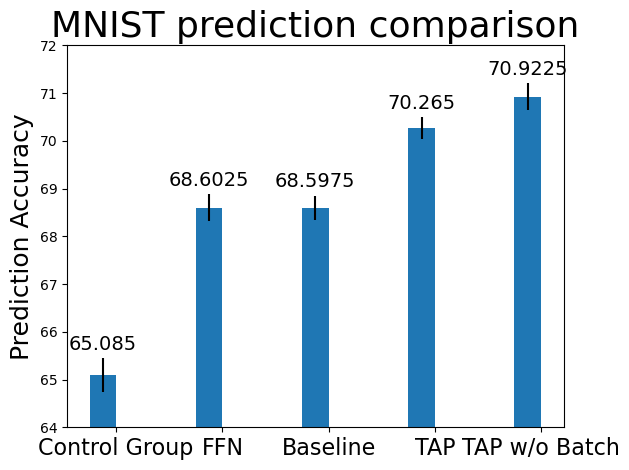

In [5]:
import matplotlib.pyplot as plt
import numpy as np


axis_labels = ['Control Group', 'FFN', 'Baseline', 'TAP', 'TAP w/o Batch']
men_means = [acc_control_mean, acc_model_mean, acc_base_mean, acc_attention_mean, acc_attention_nobatch_mean]
error = [acc_control_std/np.sqrt(20), acc_model_std/np.sqrt(20), acc_base_std/np.sqrt(20), acc_attention_std/np.sqrt(20), acc_attention_nobatch_std/np.sqrt(20)]
x = np.arange(len(axis_labels))  # the label locations
width = 0.25  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, men_means,  width, yerr=error)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylim([64, 72])
ax.set_ylabel('Prediction Accuracy', fontsize = 18)
ax.set_title('MNIST prediction comparison', fontsize = 26)
ax.set_xticks(x, axis_labels,fontsize = 16)

ax.bar_label(rects1, padding=3, fontsize = 14)

fig.tight_layout()

plt.savefig("MNIST.pdf")

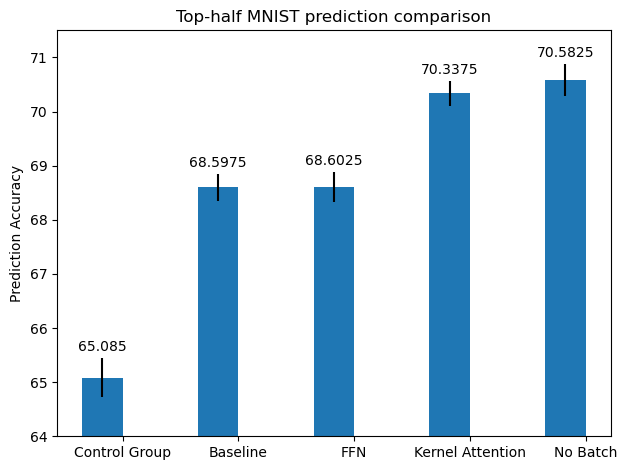

In [55]:
import matplotlib.pyplot as plt
import numpy as np


x_labels = ['Control Group','Baseline', 'FFN', 'Kernel Attention', 'No Batch']
men_means = [acc_control.mean(), acc_base.mean(), acc_model.mean(), acc_attention_kernel.mean(), acc_attention_nobatch.mean()]
error = [acc_control.std()/np.sqrt(20), acc_base.std()/np.sqrt(20), acc_model.std()/np.sqrt(20), acc_attention_kernel.std()/np.sqrt(20), acc_attention_nobatch.std()/np.sqrt(20)]
x = np.arange(len(x_labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, men_means,  width, yerr=error)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylim([64, 71.5])
ax.set_ylabel('Prediction Accuracy')
ax.set_title('Top-half MNIST prediction comparison')
ax.set_xticks(x, x_labels)

ax.bar_label(rects1, padding=3)

fig.tight_layout()

plt.savefig("MNIST comparison")

winsound.Beep(freq, duration)